### Multi-Object SSP Dynamics with Error Analysis and Benchmarking

In this notebook, benchmarks that involve calculating the error of a simulated trajectory relative to a ground truth trajectory are performed. These benchmarks can be used to evaluate the effects of varying SSP dimensionality, varying simulation methods, and varying approaches to training the models used to implement these simulation methods. The simulated trajectory works by evaluating a model of the form:

$SSP = g(SSP, VSSP)$

where $VSSP$ is encoding all of the objects' velocities into a single pointer.

In [1]:
%matplotlib inline
import string
import numpy as np
import nengo_spa as spa
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

from IPython.display import HTML, display

from ssp.maps import Spatial2D
from ssp.models import Linear, MLP
from ssp.dynamics import Trajectory, TrajectoryLog
from ssp.plots import heatmap_animation, plot_error
from ssp.plots import create_quiver, create_gif
from ssp.utils import create_data, converging_trajectory, oscillating_trajectory

In [2]:
dim = 256
scale = 10

t = 2
dt = 0.05

x_len = 2
y_len = 2
x_spaces = 101
y_spaces = 101
decode_threshold = 0.35

n_epochs = 1000

ssp_map = Spatial2D(dim=dim, scale=scale, decode_threshold=decode_threshold)
ssp_map.build_grid(x_len, y_len, x_spaces, y_spaces)

### 1. Initial Visualization and Error Plotting with Test Trajectory

We implement a test trajectory that moves five objects along separate paths. This test trajectory can then be used to evaluate simulation error.

In [3]:
trajectory = converging_trajectory(ssp_map, t, dt)

xs, ys = create_data(
    ssp_map, [trajectory], add_noise=True, include_velocity=True)

mlp = MLP(x_dim=2*dim, h_dims=2*dim, y_dim=dim)
mlp.train(xs, ys, n_steps=n_epochs)

linear = Linear(x_dim=2*dim, y_dim=dim)
linear.train(xs, ys, n_steps=n_epochs)

algebraic_sims = []
algebraic_logs = TrajectoryLog(1, trajectory)

linear_sims = []
linear_logs = TrajectoryLog(1, trajectory)

nonlinear_sims = []
nonlinear_logs = TrajectoryLog(1, trajectory)

ssp = ssp_map.initialize_ssp(trajectory)

for new_ssp in ssp_map.algebraic_dynamics_gen(trajectory):
    decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
    algebraic_sims.append(ssp_map.compute_heatmap(decoded))
    algebraic_logs.update(0, ssp_map, new_ssp)
    
for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, linear):
    decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
    linear_sims.append(ssp_map.compute_heatmap(decoded))
    linear_logs.update(0, ssp_map, new_ssp)
    
for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, mlp):
    decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
    nonlinear_sims.append(ssp_map.compute_heatmap(decoded))
    nonlinear_logs.update(0, ssp_map, new_ssp)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.


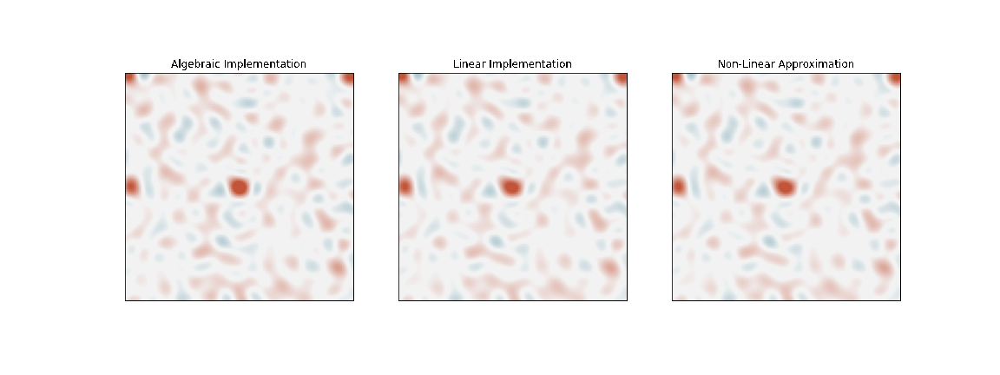

In [4]:
sims = [algebraic_sims, linear_sims, nonlinear_sims]
figsize = (16, 6)
titles = ['Algebraic Implementation', 'Linear Implementation', 'Non-Linear Approximation']

ani = heatmap_animation(sims, figsize, titles=titles)

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

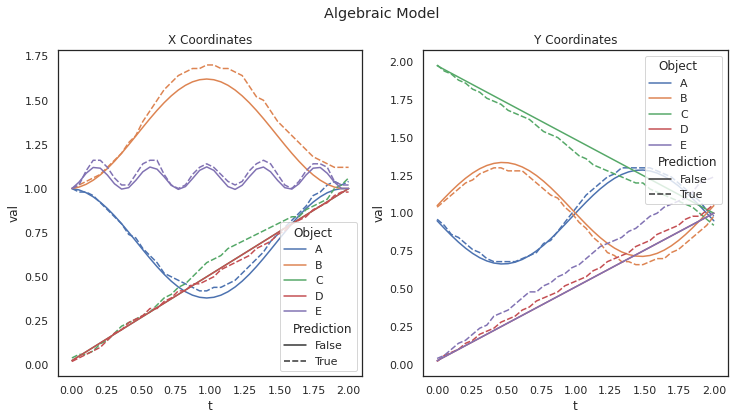

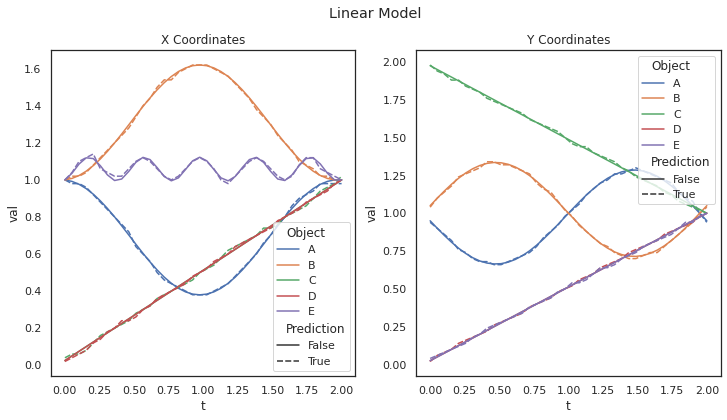

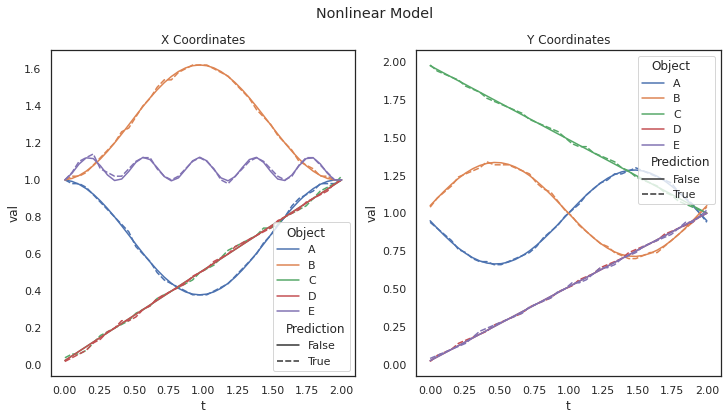

In [5]:
sns.set(style="white", palette="deep")

titles = ['Algebraic Model', 'Linear Model', 'Nonlinear Model']
logs = [algebraic_logs, linear_logs, nonlinear_logs]

for title, log in zip(titles, logs):
    plot_error(log, title)

### 2. Computing Mean Trajectory Errors

We can run multiple experiments with different initializations of the SSPs used to simulate the trajectory in question to get a sense of general tendencies observed using different simulation methods. Simulation is quite accurate using both a linear model and a simple multi-layer perceptron.

In [6]:
n_trials = 5
nonlinear_logs = TrajectoryLog(n_trials, trajectory)
linear_logs = TrajectoryLog(n_trials, trajectory)

# log over multiple trials to get error bars    
for trial in range(n_trials):
    ssp_map = Spatial2D(dim=dim, scale=scale)
    ssp_map.build_grid(x_len, y_len, x_spaces, y_spaces)

    ssp = ssp_map.initialize_ssp(trajectory)

    xs, ys = create_data(
        ssp_map, [trajectory], add_noise=True, include_velocity=True)

    mlp = MLP(x_dim=2*dim, h_dims=2*dim, y_dim=dim)
    mlp.train(xs, ys, n_steps=n_epochs)

    linear = Linear(x_dim=2*dim, y_dim=dim)
    linear.train(xs, ys, n_steps=n_epochs)
    
    linear_sims = []
    nonlinear_sims = []

    for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, linear):
        decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
        nonlinear_sims.append(ssp_map.compute_heatmap(decoded))
        nonlinear_logs.update(trial, ssp_map, new_ssp)
    
    for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, mlp):
        decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
        linear_sims.append(ssp_map.compute_heatmap(decoded))
        linear_logs.update(trial, ssp_map, new_ssp)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

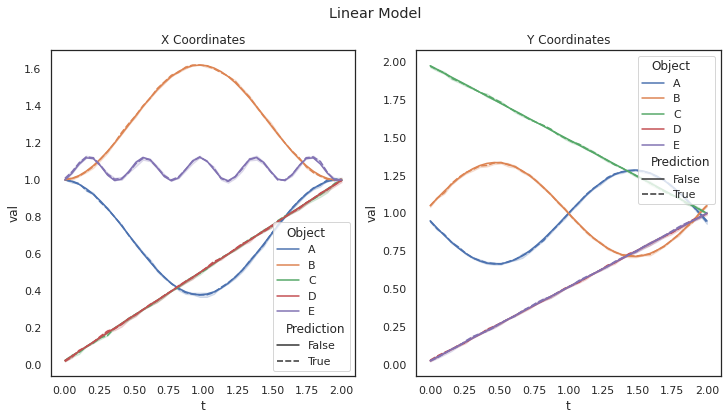

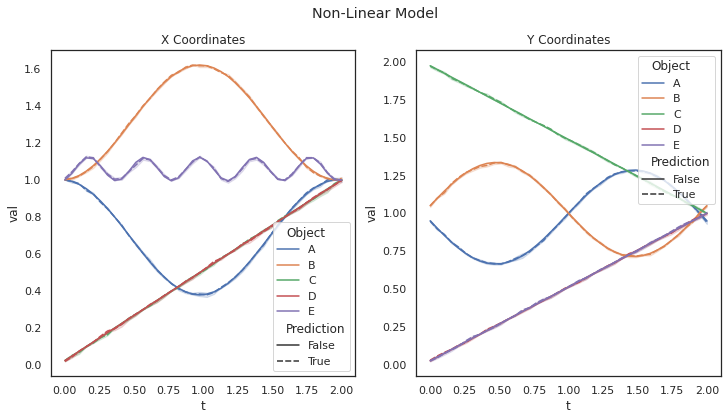

In [7]:
sns.set(style="white", palette="deep")
logs = [linear_logs, nonlinear_logs]
titles = ['Linear Model', 'Non-Linear Model']

for log, title in zip(logs, titles):
    plot_error(log, title)

### 3. Training on Multiple Trajectories




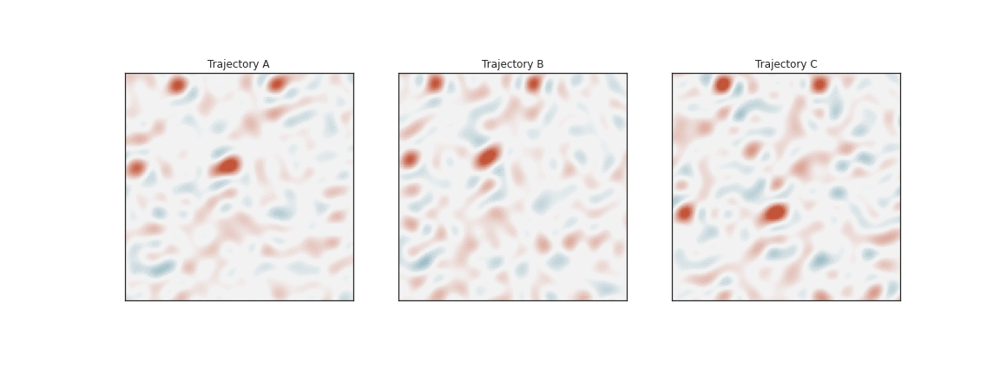

In [8]:
ssp_map = Spatial2D(dim=dim, scale=scale, decode_threshold=decode_threshold)
ssp_map.build_grid(x_len, y_len, x_spaces, y_spaces)

trajset = [oscillating_trajectory(ssp_map, t, dt, n_objects=5, noise=True) for _ in range(5)]
allsims = []
n = 3

# observe a couple of the trajectories to see what the variability is like
for trajectory in trajset[:n]:
    sims = []
    for new_ssp in ssp_map.algebraic_dynamics_gen(trajectory):
        decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
        sims.append(ssp_map.compute_heatmap(decoded))

    allsims.append(sims)
    
figsize = (16, 6)
titles = ['Trajectory A', 'Trajectory B', 'Trajectory C']

ani = heatmap_animation(allsims, figsize, titles=titles)

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

In [9]:
# now try training on linear and non-linear approximators
xs, ys = create_data(
    ssp_map, trajset, add_noise=False, include_velocity=True)

mlp = MLP(x_dim=2*dim, h_dims=2*dim, y_dim=dim)
mlp.train(xs, ys, n_steps=n_epochs)

linear = Linear(x_dim=2*dim, y_dim=dim)
linear.train(xs, ys, n_steps=n_epochs)

linear_sims = []
nonlinear_sims = []

trajectory = np.random.choice(trajset)
nonlinear_logs = TrajectoryLog(1, trajectory)
linear_logs = TrajectoryLog(1, trajectory)

ssp = ssp_map.initialize_ssp(trajectory)

for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, linear):
    decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
    nonlinear_sims.append(ssp_map.compute_heatmap(decoded))
    nonlinear_logs.update(0, ssp_map, new_ssp)

for new_ssp in ssp_map.modelled_dynamics_gen_v2(trajectory, mlp):
    decoded = ssp_map.cleanup(new_ssp, trajectory.object_names)
    linear_sims.append(ssp_map.compute_heatmap(decoded))
    linear_logs.update(0, ssp_map, new_ssp)

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.

HtmlProgressBar cannot be displayed. Please use the TerminalProgressBar. It can be enabled with `nengo.rc['progress']['progress_bar'] = 'nengo.utils.progress.TerminalProgressBar'`.


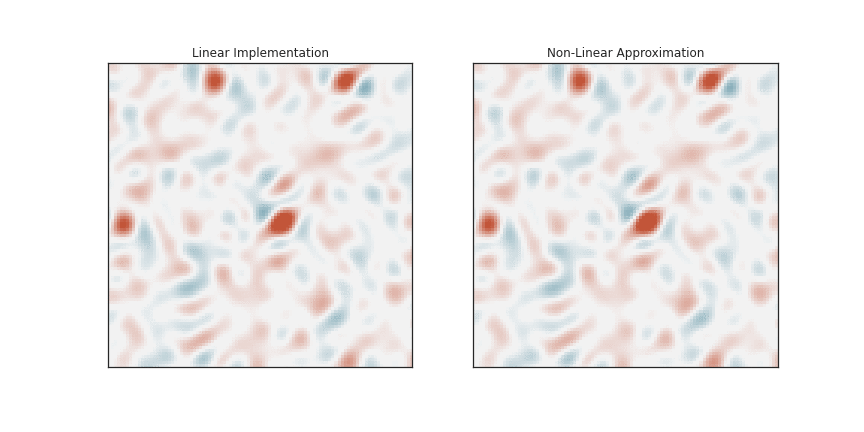

In [10]:
sims = [linear_sims, nonlinear_sims]
figsize = (12, 6)
titles = ['Linear Implementation', 'Non-Linear Approximation']

ani = heatmap_animation(sims, figsize, titles=titles)

HTML('<img src="data:image/gif;base64,{0}" />'.format(create_gif(ani)))

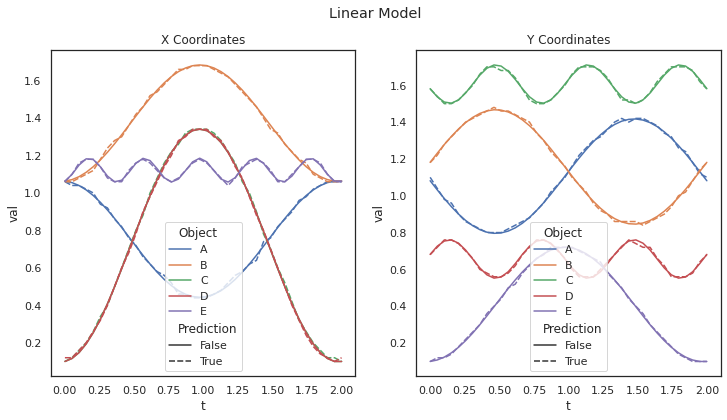

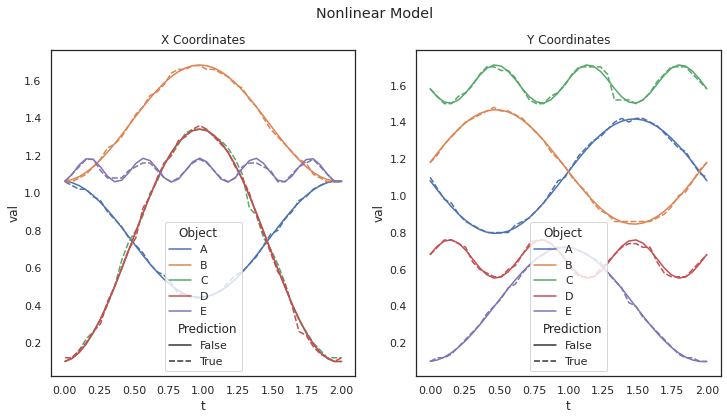

In [11]:
titles = ['Linear Model', 'Nonlinear Model']
logs = [linear_logs, nonlinear_logs]

for title, log in zip(titles, logs):
    plot_error(log, title)

Multiple trajectories often doesn't work well because the ML system is expected to learn how to resolve ambiguities between trajectories that overlap in space with different velocities (the ML models are not given any input beyond the current SSP). That is an impossible task.

### 4. Performing Method Comparisons

Now we'll compare model generalization by test RMSE across a number of methods: (a) algebraic SSP manipulation, (b) linear approximation, (c) non-linear approximation, (d) linear approximation with noise augmentation, and (e) non-linear approximation with noise augmentation. We do so training on 100 trajectories and testing on 50 trajectories.

In [ ]:
n_trials = 1
dim_samples = []
obj_samples = []

def run_trial(dim, n_objects, sample_list,
              n_train=100, n_test=50, n_epochs=n_epochs):
    # initialize map and train the models
    ssp_map = Spatial2D(dim=dim, scale=scale, decode_threshold=decode_threshold)
    ssp_map.build_grid(x_len, y_len, x_spaces, y_spaces)

    # build trajectories
    all_trajectories = []
    for n in range(n_train + n_test):
        traj = oscillating_trajectory(ssp_map, t, dt, n_objects=n_objects, noise=True)
        all_trajectories.append(traj)

    train_trajectories = all_trajectories[:n_train]
    test_trajectories = all_trajectories[n_train:]

    # approximation without noise augmentation
    xs, ys = create_data(
        ssp_map, train_trajectories, add_noise=False, include_velocity=True)

    mlp = MLP(x_dim=2*dim, h_dims=2*dim, y_dim=dim)
    mlp.train(xs, ys, n_steps=n_epochs)

    linear = Linear(x_dim=2*dim, y_dim=dim)
    linear.train(xs, ys, n_steps=n_epochs)

    # approximation with noise augmentation
    aug_xs, aug_ys = create_data(
        ssp_map, train_trajectories, add_noise=True, include_velocity=True)

    aug_mlp = MLP(x_dim=2*dim, h_dims=2*dim, y_dim=dim)
    aug_mlp.train(aug_xs, aug_ys, n_steps=n_epochs)

    aug_linear = Linear(x_dim=2*dim, y_dim=dim)
    aug_linear.train(aug_xs, aug_ys, n_steps=n_epochs)

    for test_trajectory in test_trajectories:
        # setup logging
        alg_log = TrajectoryLog(1, test_trajectory)
        lin_log = TrajectoryLog(1, test_trajectory)
        mlp_log = TrajectoryLog(1, test_trajectory)
        aug_lin_log = TrajectoryLog(1, test_trajectory)
        aug_mlp_log = TrajectoryLog(1, test_trajectory)

        # algebraic method
        for new_ssp in ssp_map.algebraic_dynamics_gen(test_trajectory):
            alg_log.update(0, ssp_map, new_ssp)

        # ML methods
        for new_ssp in ssp_map.modelled_dynamics_gen_v2(test_trajectory, linear):
            lin_log.update(0, ssp_map, new_ssp)

        for new_ssp in ssp_map.modelled_dynamics_gen_v2(test_trajectory, mlp):
            mlp_log.update(0, ssp_map, new_ssp)

        for new_ssp in ssp_map.modelled_dynamics_gen_v2(test_trajectory, aug_linear):
            aug_lin_log.update(0, ssp_map, new_ssp)

        for new_ssp in ssp_map.modelled_dynamics_gen_v2(test_trajectory, aug_mlp):
            aug_mlp_log.update(0, ssp_map, new_ssp)

        # create data samples to use for plotting
        sample_list.append(
            {'Method': 'Algebraic',
             'RMSE': alg_log.global_error,
             'N Objects': n_objects,
             'D': dim})
        sample_list.append(
            {'Method': 'Linear',
             'RMSE': lin_log.global_error,
             'N Objects': n_objects,
             'D': dim})
        sample_list.append(
            {'Method': 'MLP',
             'RMSE': mlp_log.global_error,
             'N Objects': n_objects,
             'D': dim})
        sample_list.append(
            {'Method': 'Linear Aug',
             'RMSE': aug_lin_log.global_error,
             'N Objects': n_objects,
             'D': dim})
        sample_list.append(
            {'Method': 'MLP Aug',
             'RMSE': aug_mlp_log.global_error,
             'N Objects': n_objects,
             'D': dim})

        
# collect data for two experiments
for n_objects in (2, 3, 4, 5):
    for trial in range(n_trials):
        run_trial(512, n_objects, obj_samples)
        
for dim in [256, 512, 1024]:
    for trial in range(n_trials):
        run_trial(dim, 5, dim_samples)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

sns.barplot(x="Method", y="RMSE", hue="N Objects", data=pd.DataFrame(obj_samples), ax=ax1)
sns.barplot(x="Method", y="RMSE", hue="D", data=pd.DataFrame(dim_samples), ax=ax2)

ax1.set_title('SSP Dimensionality of 512')
ax2.set_title('5 Objects In Trajectory')
# plt.suptitle('Training on 10 Sample Trajectories')
plt.show()